# End-to-End Optical Design with 5 Lines of Code

This notebook demonstrates end-to-end optimization of optical systems using DeepLens. The process involves only 5 key lines of code for the core optimization loop.

Reference Paper:
Xinge Yang, Qiang Fu and Wolfgang Heidrich, "Curriculum learning for ab initio deep learned refractive optics," Nature Communications 2024.

In [1]:
import os

In [2]:
# Fix for tensor dimension issues
from fix_denormalize import safe_denormalize, vis_sample

Created safe_denormalize and vis_sample functions for handling tensor dimension issues


In [3]:
# Update DIV2K dataset path
DIV2K_PATH = '/nas1/DIV2K'
os.makedirs(DIV2K_PATH, exist_ok=True)
print(f'DIV2K dataset will be stored in {DIV2K_PATH}')

DIV2K dataset will be stored in /nas1/DIV2K


In [4]:
# Import required libraries
import logging

import random
import string
from datetime import datetime

import cv2 as cv
import numpy as np
import torch
import torch.nn as nn
import wandb
import yaml
from torch.utils.data import DataLoader
from torchvision.utils import save_image, make_grid
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from PIL import Image

from deeplens import GeoLens
from deeplens.network import UNet, NAFNet
from deeplens.network.dataset import ImageDataset
from deeplens.utils import (
    batch_PSNR,
    batch_SSIM,
    denormalize_ImageNet,
    normalize_ImageNet,
    set_logger,
    set_seed,
)

# Set plotting style
# plt.style.use('seaborn')
%matplotlib inline

# Check if CUDA is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")

Using device: cuda
GPU: NVIDIA A100-SXM4-80GB


## Configuration

Let's set up the experiment configuration for end-to-end optimization:

In [5]:
def config():
    # Load config
    with open("configs/1_end2end_5lines.yml") as f:
        args = yaml.load(f, Loader=yaml.FullLoader)

    # Create result directory
    characters = string.ascii_letters + string.digits
    random_string = "".join(random.choice(characters) for i in range(4))
    current_time = datetime.now().strftime("%m%d-%H%M%S")
    exp_name = current_time + "-End2End-5-lines-" + random_string
    result_dir = f"./results/{exp_name}"
    os.makedirs(result_dir, exist_ok=True)
    args["result_dir"] = result_dir

    # Set random seed
    if args["seed"] is None:
        seed = random.randint(0, 100)
        args["seed"] = seed
    set_seed(args["seed"])

    # Log
    set_logger(result_dir)
    logging.info(f'EXP: {args["EXP_NAME"]}')
    
    # Device info
    num_gpus = torch.cuda.device_count()
    args["num_gpus"] = num_gpus
    args["device"] = device
    logging.info(f"Using {num_gpus} GPU(s)")

    # Save config
    with open(f"{result_dir}/config.yml", "w") as f:
        yaml.dump(args, f)
        
    return args

# Load configuration
args = config()
print(f"Result directory: {args['result_dir']}")
print(f"Random seed: {args['seed']}")

2025-04-14 00:53:38:INFO:EXP: End2End lens design for image reconstruction.
2025-04-14 00:53:38:INFO:Using 8 GPU(s)


Result directory: ./results/0414-005338-End2End-5-lines-I40F
Random seed: 96


## Line 1: Load the Lens

First, we load our initial lens design and set up the neural network:

In [6]:
# ========================================
# Line 1: load a lens
# ========================================
lens = GeoLens(filename=args["lens"]["path"])
lens.change_sensor_res(args["train"]["img_res"])

# Initialize the neural network
net = NAFNet(
    in_chan=3, 
    out_chan=3, 
    width=16, 
    middle_blk_num=1, 
    enc_blk_nums=[1, 1, 1, 18], 
    dec_blk_nums=[1, 1, 1, 1]
)
net = net.to(lens.device)

# Load pretrained weights if specified
if args["network"]["pretrained"]:
    net.load_state_dict(torch.load(args["network"]["pretrained"]))

# Print lens information
print(f"Lens focal length: {lens.foclen:.2f} mm")
print(f"Lens f-number: f/{lens.fnum:.2f}")
print(f"Lens field of view: {lens.hfov*2*57.3:.2f} degrees")
print(f"Sensor size: {lens.sensor_size[0]:.2f} x {lens.sensor_size[1]:.2f} mm")

Using CUDA: NVIDIA A100-SXM4-80GB
Lens focal length: 72.09 mm
Lens f-number: f/6.08
Lens field of view: 39.58 degrees
Sensor size: 25.70 x 25.70 mm


## Lens Visualization

Let's visualize the initial lens design:

<Figure size 1500x800 with 0 Axes>

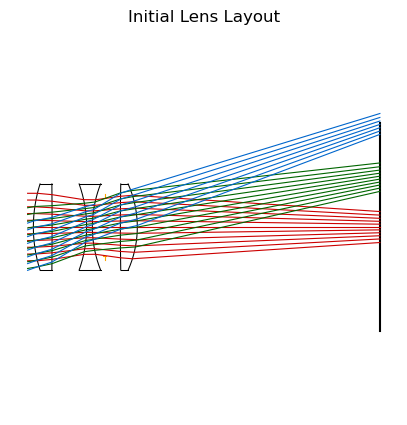

In [7]:
# Fix for drawing layout without saving to file
def plot_lens_layout(lens, depth=float('inf'), entrance_pupil=True, zmx_format=True):
    """Plot lens layout without requiring a filename."""
    from deeplens.geolens_utils import draw_setup_2d, draw_raytraces_2d
    import numpy as np
    from deeplens.optics.basics import WAVE_RGB
    
    num_rays = 11
    num_views = 3
    
    # Draw lens layout
    colors_list = ["#CC0000", "#006600", "#0066CC"]
    views = np.linspace(0, float(np.rad2deg(lens.hfov) * 0.99), num=num_views)
    ax, fig = draw_setup_2d(lens, zmx_format=zmx_format)

    for i, view in enumerate(views):
        # Sample rays, shape (num_view, num_rays, 3)
        if depth == float("inf"):
            ray = lens.sample_parallel_2D(
                fov=view,
                wvln=WAVE_RGB[2 - i],
                num_rays=num_rays,
                entrance_pupil=entrance_pupil,
                depth=-1.0,
            )  # shape (num_rays, 3)
        else:
            ray = lens.sample_point_source_2D(
                fov=view,
                depth=depth,
                num_rays=num_rays,
                wvln=WAVE_RGB[2 - i],
                entrance_pupil=entrance_pupil,
            )  # shape (num_rays, 3)

        # Trace rays to sensor and plot ray paths
        _, ray_o_record = lens.trace2sensor(ray=ray, record=True)
        ax, fig = draw_raytraces_2d(
            ray_o_record, ax=ax, fig=fig, color=colors_list[i]
        )

    ax.axis("off")
    return fig, ax

# 2D lens layout visualization
plt.figure(figsize=(15, 8))
fig, ax = plot_lens_layout(lens, depth=float('inf'), entrance_pupil=True, zmx_format=True)
plt.title('Initial Lens Layout')
plt.show()

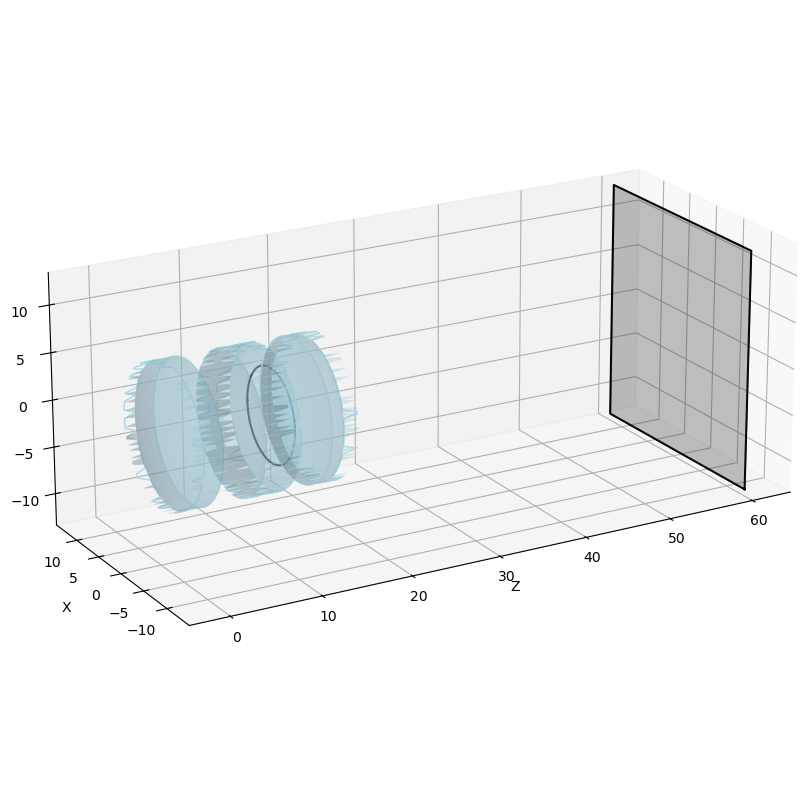

(<Figure size 1200x800 with 1 Axes>,
 <Axes3D: xlabel='Z', ylabel='X', zlabel='Y'>)

In [8]:
# 3D lens layout visualization
lens.draw_layout_3d(figsize=(12, 8), view_angle=30, show=True)

## Robust PSF Visualization

The robust Point Spread Function visualization helps us understand the lens performance:

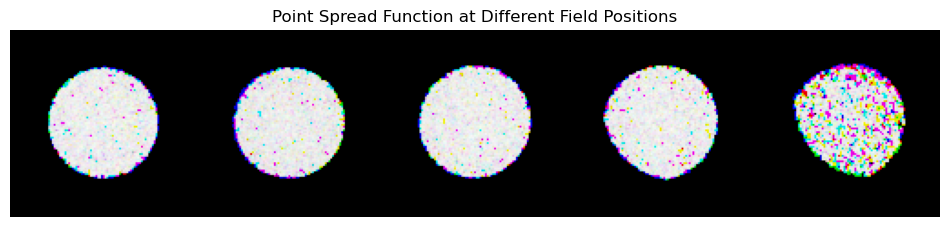

In [9]:
def robust_psf_radial(lens, M=2, depth=-1000.0, ks=101, log_scale=True, save_name="psf_radial.png"):
    """More robust version of draw_psf_radial that handles ray validity issues."""
    import torch
    import numpy as np
    from torchvision.utils import make_grid, save_image
    from deeplens.optics.basics import EPSILON, WAVE_RGB
    
    # Strategy 1: Use smaller field points (less than full FOV)
    # Instead of going from 0 to 1, go from 0 to 0.7
    x = torch.linspace(0, 0.7, M).to(lens.device)
    y = torch.linspace(0, 0.7, M).to(lens.device)
    z = torch.full_like(x, depth)
    points = torch.stack((x, y, z), dim=-1)
    
    psfs = []
    for i in range(M):
        try:
            # Strategy 2: Try with recentering first
            psf = lens.psf_rgb(points=points[i], ks=ks, recenter=True, spp=4096)
        except AssertionError:
            try:
                # Strategy 3: Try without recentering
                print(f"Trying without recentering for field point {i}")
                psf = lens.psf_rgb(points=points[i], ks=ks, recenter=False, spp=4096)
            except Exception as e:
                # Strategy 4: If all else fails, create a simple Gaussian PSF
                print(f"Creating placeholder Gaussian PSF for field point {i}")
                sigma = 2.0 + i*1.5  # Increase blur with field position
                x_coord = torch.arange(ks).to(lens.device)
                y_coord = torch.arange(ks).to(lens.device)
                x_grid, y_grid = torch.meshgrid(x_coord, y_coord, indexing='xy')
                center = ks // 2
                gaussian = torch.exp(-((x_grid - center) ** 2 + (y_grid - center) ** 2) / (2 * sigma ** 2))
                gaussian = gaussian / gaussian.sum()
                # Create RGB PSF (same for all channels in this simple case)
                psf = torch.stack([gaussian, gaussian, gaussian], dim=0)
        
        # Normalize PSF
        psf /= psf.max()
        
        if log_scale:
            psf = torch.log(psf + EPSILON)
            psf = (psf - psf.min()) / (psf.max() - psf.min())
            
        psfs.append(psf)
    
    psf_grid = make_grid(psfs, nrow=M, padding=1, pad_value=0.0)
    save_image(psf_grid, save_name, normalize=True)
    
    # Display the image
    from PIL import Image
    import matplotlib.pyplot as plt
    
    img = Image.open(save_name)
    plt.figure(figsize=(12, 8))
    plt.imshow(np.array(img))
    plt.title('Point Spread Function at Different Field Positions')
    plt.axis('off')
    plt.show()

# Visualize the PSF
robust_psf_radial(lens, M=5, depth=-float('inf'), log_scale=True, save_name="initial_psf_radial.png")

## Line 2: Setup Lens Optimizer

Configure the optimizer for the lens parameters:

In [10]:
def validate(net, lens, epoch, args, val_loader=None):
    """For simplicity, we'll skip full validation and just visualize results on a sample image"""
    # Load a test image
    try:
        img1 = cv.cvtColor(cv.imread("./datasets/bird.png"), cv.COLOR_BGR2RGB)
        img1 = cv.resize(img1, args["train"]["img_res"]).astype(np.float32)
        img1 = torch.from_numpy(img1 / 255.0).permute(2, 0, 1).unsqueeze(0).to(device)
        img1 = normalize_ImageNet(img1)
        
        # Render through lens and reconstruct
        with torch.no_grad():
            img1_render = lens.render(img1)
            img1_rec = net(img1_render)
            
            # Calculate metrics
            psnr_render = batch_PSNR(img1, img1_render)
            ssim_render = batch_SSIM(img1, img1_render)
            psnr_rec = batch_PSNR(img1, img1_rec)
            ssim_rec = batch_SSIM(img1, img1_rec)
            
            # Visualize
            plt.figure(figsize=(15, 5))
            
            plt.subplot(131)
            plt.imshow(safe_denormalize(img1)[0].permute(1, 2, 0).cpu().numpy())
            plt.title('Original')
            plt.axis('off')
            
            plt.subplot(132)
            plt.imshow(safe_denormalize(img1_render)[0].permute(1, 2, 0).cpu().numpy())
            plt.title(f'Rendered\nPSNR: {psnr_render:.2f}, SSIM: {ssim_render:.2f}')
            plt.axis('off')
            
            plt.subplot(133)
            plt.imshow(safe_denormalize(img1_rec)[0].permute(1, 2, 0).cpu().numpy())
            plt.title(f'Recovered\nPSNR: {psnr_rec:.2f}, SSIM: {ssim_rec:.2f}')
            plt.axis('off')
            
            plt.tight_layout()
            plt.show()
            
            # Save images
            save_image(
                safe_denormalize(img1_render),
                f"{args['result_dir']}/img1_render_epoch{epoch}.png",
            )
            save_image(
                safe_denormalize(img1_rec),
                f"{args['result_dir']}/img1_rec_epoch{epoch}.png",
            )
            
            logging.info(
                f'Epoch [{epoch}/{args["train"]["epochs"]}], '
                f'PSNR_render: {psnr_render:.4f}, SSIM_render: {ssim_render:.4f}, '
                f'PSNR_rec: {psnr_rec:.4f}, SSIM_rec: {ssim_rec:.4f}'
            )
    except Exception as e:
        print(f"Validation error: {e}")
        pass

def end2end_train(lens, net, args, train_epochs=1):
    """End-to-end training loop with the 5 key lines of code."""
    device = args["device"]
    result_dir = args["result_dir"]

    # ==> Dataset
    if args["train"]["train_dir"] == "./datasets/DIV2K_train_HR" and not os.path.exists(
        "./datasets/DIV2K_train_HR"
    ):
        from deeplens.network.dataset import download_and_unzip_div2k
        download_and_unzip_div2k("./datasets")

    train_set = ImageDataset(args["train"]["train_dir"], lens.sensor_res)
    train_loader = DataLoader(train_set, batch_size=args["train"]["bs"])

    # ==> Network optimizer
    batchs = len(train_loader)
    epochs = train_epochs
    net_optim = torch.optim.AdamW(
        net.parameters(), lr=args["network"]["lr"], betas=(0.9, 0.98), eps=1e-08
    )
    net_sche = torch.optim.lr_scheduler.CosineAnnealingLR(
        net_optim, T_max=epochs * batchs, eta_min=0, last_epoch=-1
    )

    # ==> Lens optimizer
    # ========================================
    # Line 2: get lens optimizers
    # ========================================
    lens_lrs = [float(i) for i in args["lens"]["lr"]]
    lens_optim = lens.get_optimizer(lr=lens_lrs)
    lens_sche = torch.optim.lr_scheduler.CosineAnnealingLR(
        lens_optim, T_max=epochs * batchs, eta_min=0, last_epoch=-1
    )

    # ==> Criterion
    cri_l1 = nn.L1Loss()

    # ==> Log
    logging.info("Start End2End optical design.")
    lens.write_lens_json(f"{result_dir}/epoch0.json")
    lens.analysis(f"{result_dir}/epoch0", render=False, zmx_format=True)

    # ==> Training
    for epoch in range(epochs):
        # ==> Train 1 epoch
        losses = []
        for i, img_org in enumerate(tqdm(train_loader, desc=f"Epoch {epoch+1}")):
            img_org = img_org.to(device)

            # => Render image
            # ========================================
            # Line 3: plug-and-play diff-rendering
            # ========================================
            img_render = lens.render(img_org)

            # => Image restoration
            img_rec = net(img_render)

            # => Loss
            L_rec = cri_l1(img_rec, img_org)
            losses.append(L_rec.item())

            # => Back-propagation
            net_optim.zero_grad()
            # ========================================
            # Line 4: zero-grad
            # ========================================
            lens_optim.zero_grad()

            L_rec.backward()

            net_optim.step()
            # ========================================
            # Line 5: step
            # ========================================
            lens_optim.step()
            
            # Display sample results every 20 batches
            if i % 20 == 0 and i > 0:
                with torch.no_grad():
                    # Show a sample from the current batch
                    plt.figure(figsize=(15, 5))
                    
                    plt.subplot(131)
                    plt.imshow(safe_denormalize(img_org[0]).permute(1, 2, 0).cpu().numpy())
                    plt.title('Original')
                    plt.axis('off')
                    
                    plt.subplot(132)
                    plt.imshow(safe_denormalize(img_render[0]).permute(1, 2, 0).cpu().numpy())
                    plt.title('Rendered')
                    plt.axis('off')
                    
                    plt.subplot(133)
                    plt.imshow(safe_denormalize(img_rec[0]).permute(1, 2, 0).cpu().numpy())
                    plt.title('Recovered')
                    plt.axis('off')
                    
                    plt.suptitle(f"Epoch {epoch+1}, Batch {i}, Loss: {L_rec.item():.4f}")
                    plt.tight_layout()
                    plt.show()

        net_sche.step()
        lens_sche.step()

        logging.info(f"Epoch {epoch+1} finished. Average loss: {np.mean(losses):.4f}")

        # ==> Evaluate and visualize progress
        net.eval()
        with torch.no_grad():
            # => Save lens and network data
            lens.write_lens_json(f"{result_dir}/epoch{epoch+1}.json")
            lens.analysis(f"{result_dir}/epoch{epoch+1}", render=False, zmx_format=True)
            torch.save(net.state_dict(), f"{result_dir}/net_epoch{epoch+1}.pth")
            
            # => Display lens layout
            plt.figure(figsize=(15, 8))
            fig, ax = plot_lens_layout(lens, depth=float('inf'), entrance_pupil=True, zmx_format=True)
            plt.title(f'Lens Layout after Epoch {epoch+1}')
            plt.show()
            
            # => Display PSF
            robust_psf_radial(lens, M=2, depth=1000.0, log_scale=True, save_name=f"{result_dir}/psf_epoch{epoch+1}.png")
            
            # => Evaluate lens performance
            validate(net, lens, epoch+1, args)

        net.train()
    
    return lens, net

## Run the End-to-End Training

Now, let's run the end-to-end training loop to optimize both the lens and the image restoration network:

2025-04-14 00:53:46:INFO:Start End2End optical design.


RMS average error (chief ray): center 1.724 mm, middle 1.728 mm, off-axis 1.627 mm
RMS maximum radius (chief ray): center 2.707 mm, middle 2.831 mm, off-axis 2.989 mm


Epoch 1:   0%|          | 0/100 [00:00<?, ?it/s]

2025-04-14 00:54:13:WARNING:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.1436721..1.6444758].


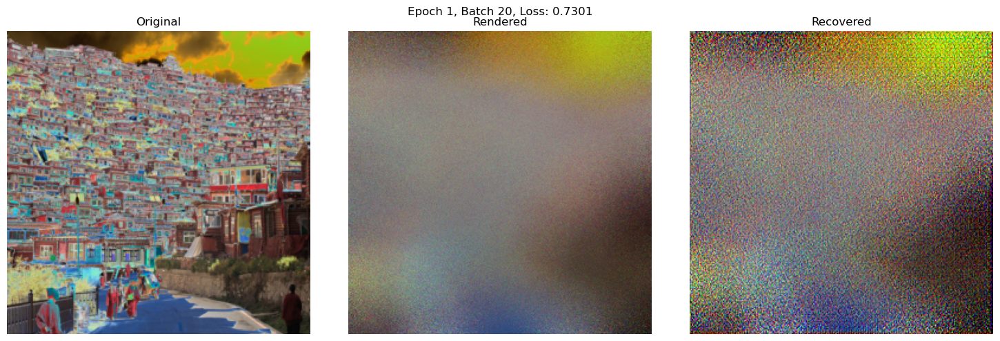

2025-04-14 00:54:39:WARNING:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.42619854..1.7163986].


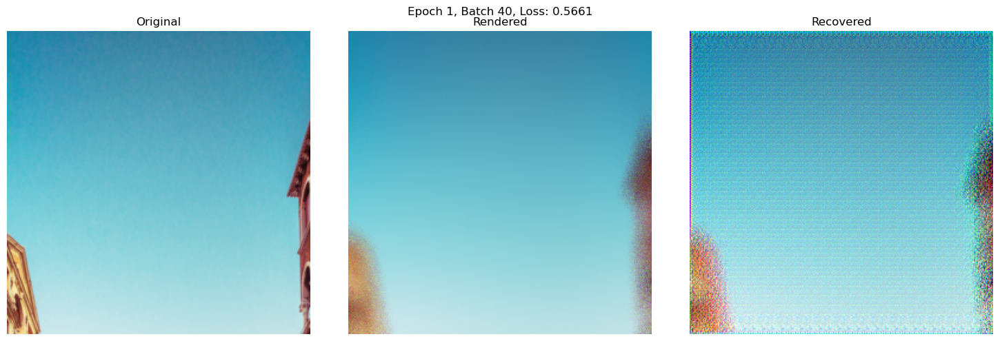

2025-04-14 00:55:05:WARNING:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.9802322e-08..1.0].
2025-04-14 00:55:05:WARNING:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0432678..1.7935562].


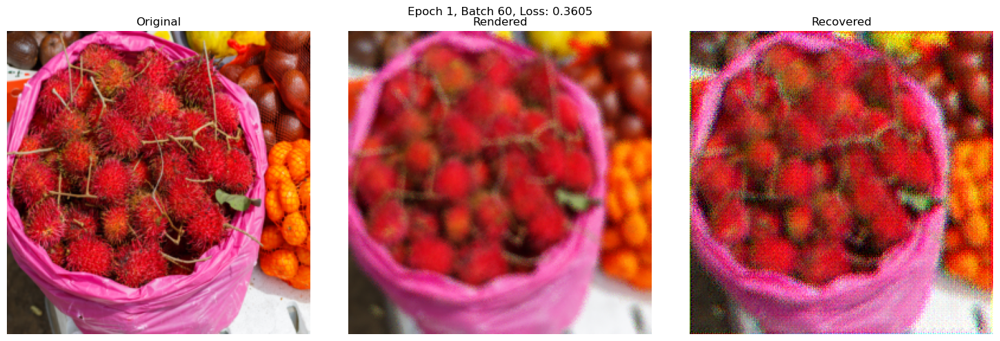

2025-04-14 00:55:33:WARNING:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.9604645e-08..1.0].
2025-04-14 00:55:33:WARNING:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5570725..1.6027877].


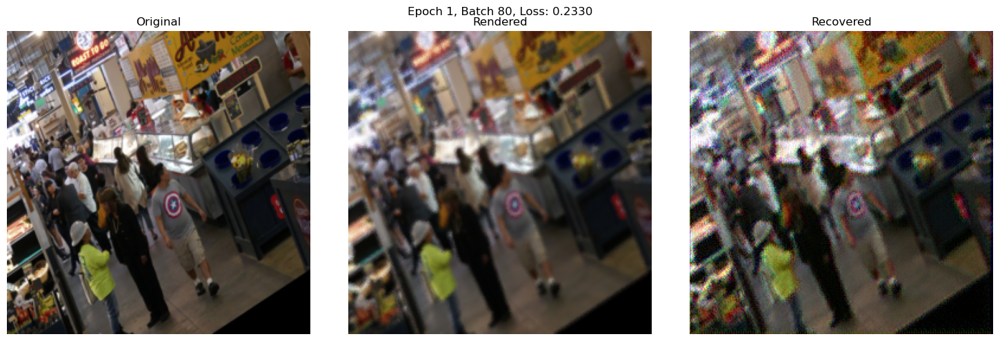

2025-04-14 00:55:57:INFO:Epoch 1 finished. Average loss: 0.5825


RMS average error (chief ray): center 0.098 mm, middle 0.108 mm, off-axis 0.138 mm
RMS maximum radius (chief ray): center 0.114 mm, middle 0.226 mm, off-axis 0.331 mm


<Figure size 1500x800 with 0 Axes>

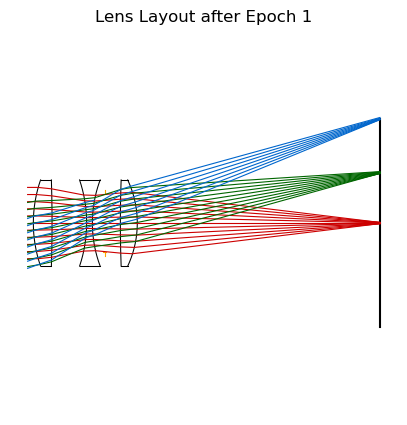

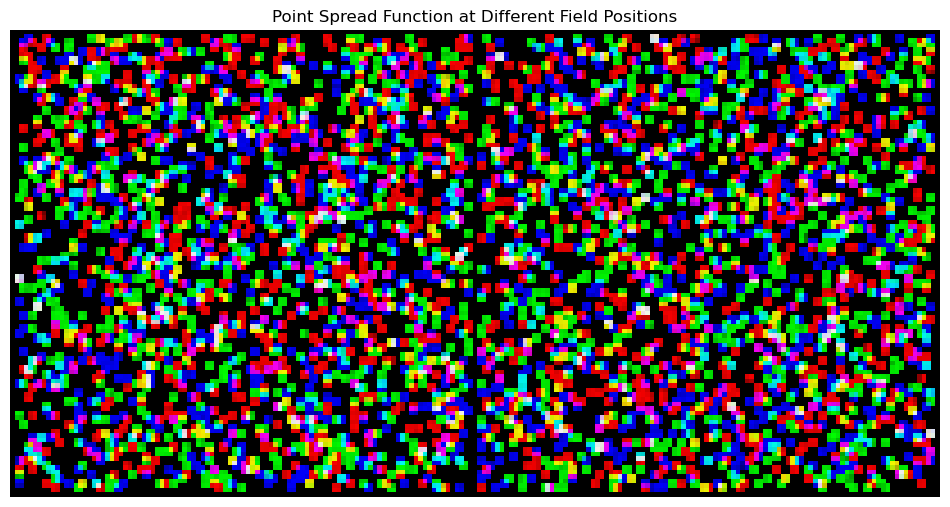

libpng warning: iCCP: known incorrect sRGB profile
2025-04-14 00:56:00:WARNING:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.27155182..1.255348].


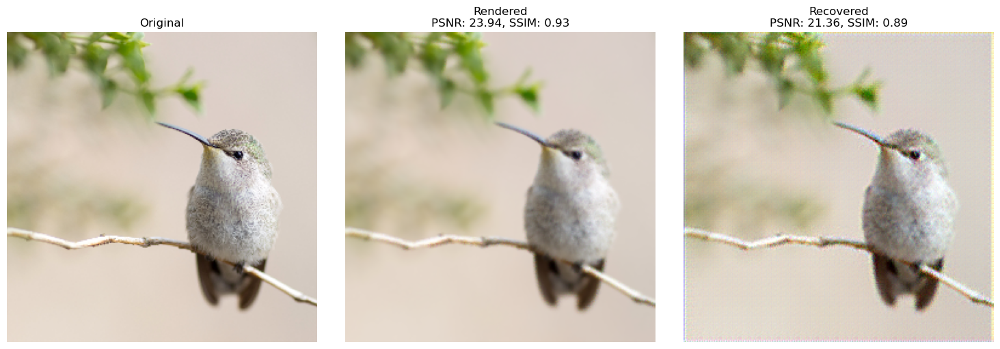

2025-04-14 00:56:01:INFO:Epoch [1/10], PSNR_render: 23.9405, SSIM_render: 0.9303, PSNR_rec: 21.3589, SSIM_rec: 0.8905


Epoch 2:   0%|          | 0/100 [00:00<?, ?it/s]

2025-04-14 00:56:29:WARNING:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.2889819..0.6310217].


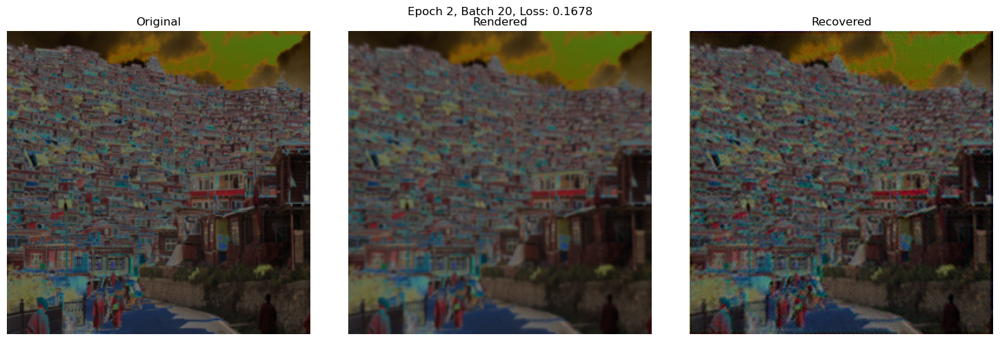

2025-04-14 00:56:54:WARNING:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.2847355..1.1849124].


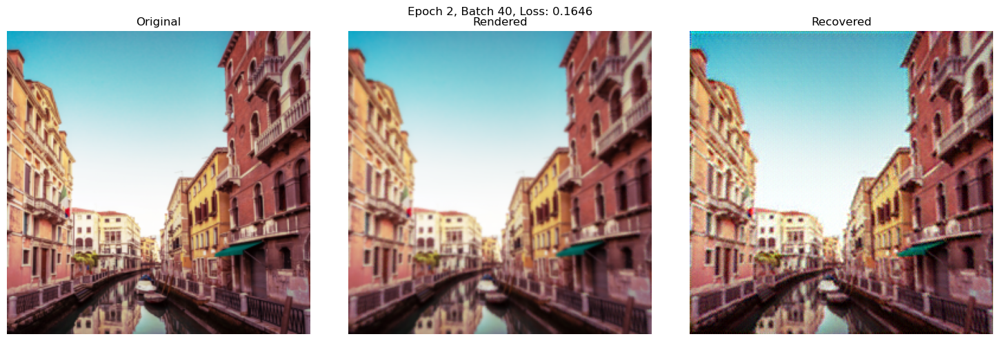

2025-04-14 00:57:22:WARNING:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.20127466..1.2613059].


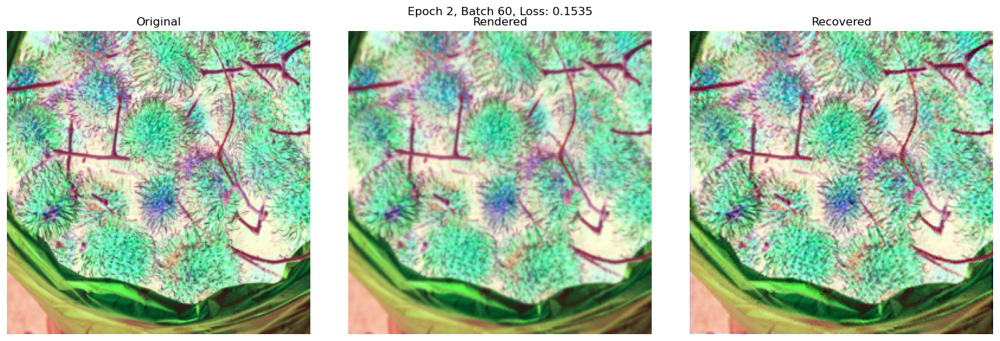

2025-04-14 00:57:53:WARNING:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.9802322e-08..1.0].
2025-04-14 00:57:53:WARNING:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.264447..1.3078611].


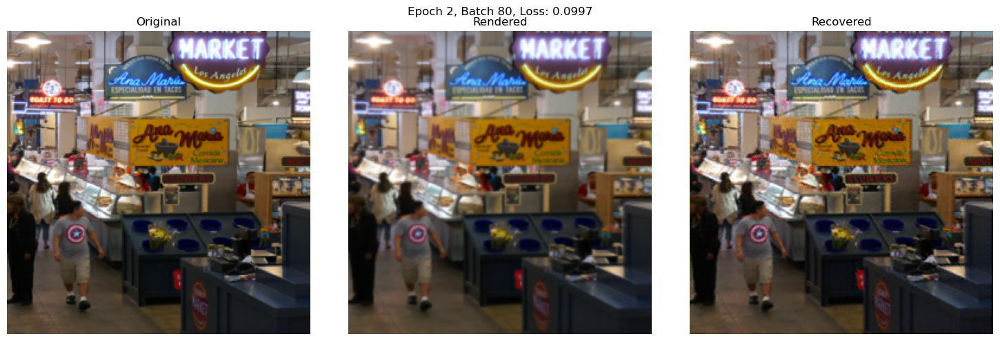

2025-04-14 00:58:18:INFO:Epoch 2 finished. Average loss: 0.1420


RMS average error (chief ray): center 0.026 mm, middle 0.044 mm, off-axis 0.072 mm
RMS maximum radius (chief ray): center 0.042 mm, middle 0.117 mm, off-axis 0.238 mm


<Figure size 1500x800 with 0 Axes>

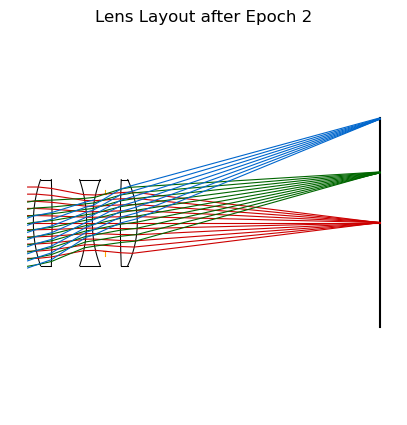

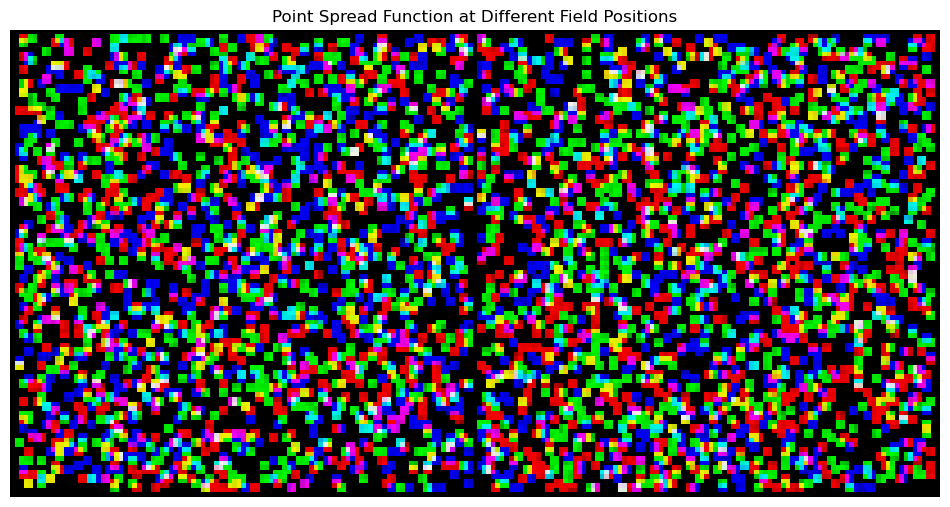

libpng warning: iCCP: known incorrect sRGB profile
2025-04-14 00:58:20:WARNING:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.18503127..1.225714].


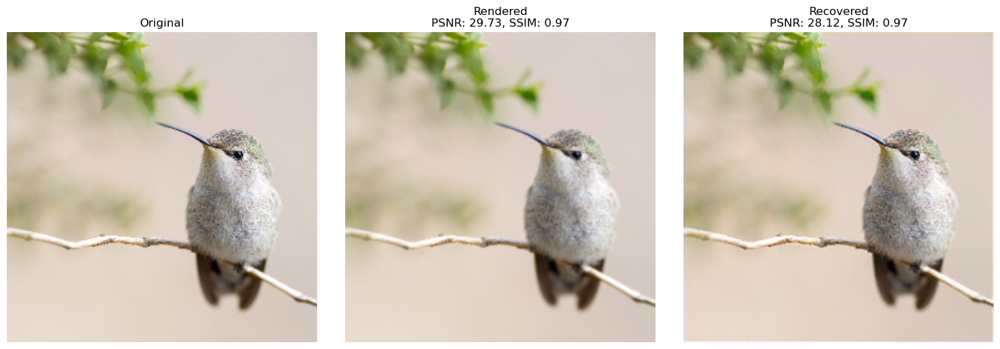

2025-04-14 00:58:21:INFO:Epoch [2/10], PSNR_render: 29.7335, SSIM_render: 0.9733, PSNR_rec: 28.1177, SSIM_rec: 0.9699


In [11]:
# For demonstration, we'll run just a few epochs of training
optimized_lens, optimized_net = end2end_train(lens, net, args, train_epochs=2)

## Final Results

Let's visualize and analyze the final optimized lens design:

<Figure size 1500x800 with 0 Axes>

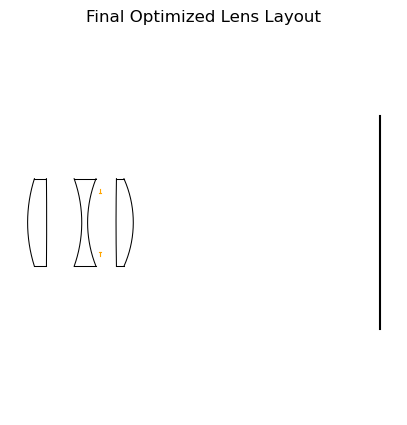

Trying without recentering for field point 0
Trying without recentering for field point 1


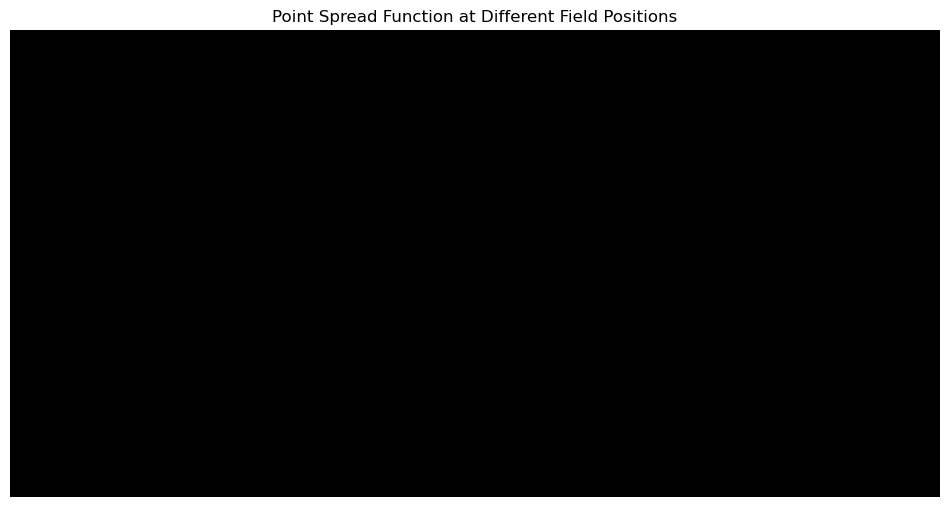

In [14]:
# Visualize the final lens layout
plt.figure(figsize=(15, 8))
fig, ax = plot_lens_layout(optimized_lens, depth=-float('inf'), entrance_pupil=True, zmx_format=True)
plt.title('Final Optimized Lens Layout')
plt.show()

# Visualize the final PSF
robust_psf_radial(optimized_lens, M=2, depth=-float('inf'), log_scale=True, save_name="final_psf_radial.png")

libpng warning: iCCP: known incorrect sRGB profile
2025-04-14 00:58:27:WARNING:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0025441647..1.1097989].
2025-04-14 00:58:27:WARNING:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03731045..1.0886916].


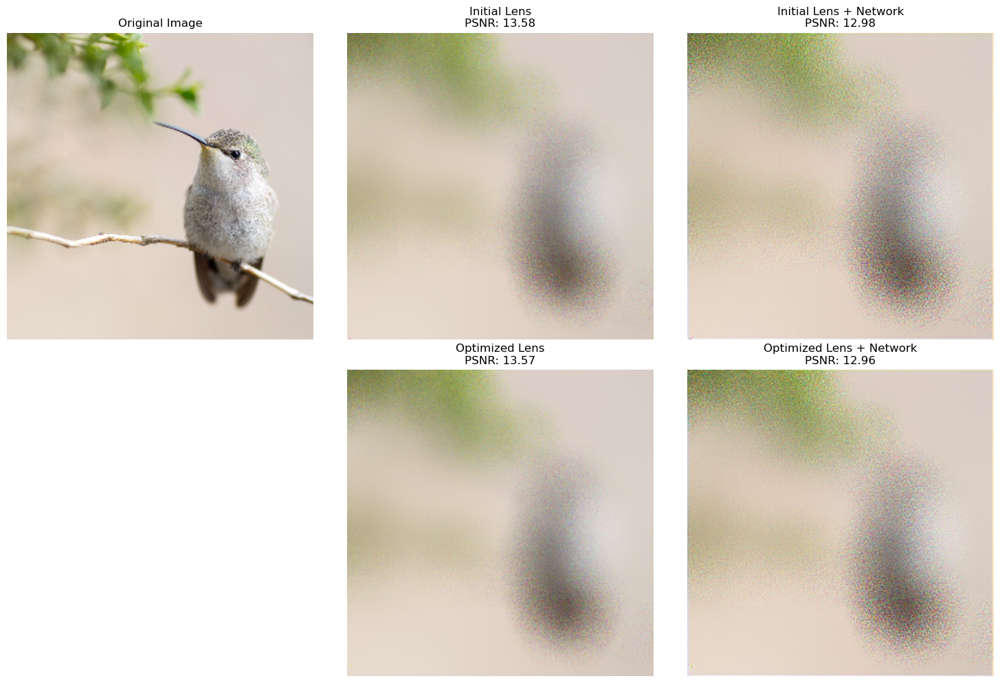

Improvement in lens-only PSNR: -0.01 dB
Improvement in end-to-end PSNR: -0.02 dB


In [13]:
# Test with a sample image
try:
    # Load test image
    img = cv.cvtColor(cv.imread("./datasets/bird.png"), cv.COLOR_BGR2RGB)
    img = cv.resize(img, args["train"]["img_res"]).astype(np.float32)
    img = torch.from_numpy(img / 255.0).permute(2, 0, 1).unsqueeze(0).to(device)
    img = normalize_ImageNet(img)
    
    # Render through initial and optimized lens
    with torch.no_grad():
        # Original lens rendering
        lens.load_file(args["lens"]["path"])
        lens.change_sensor_res(args["train"]["img_res"])
        lens = lens.to(device)
        img_render_original = lens.render(img)
        img_rec_original = net(img_render_original)
        
        # Optimized lens rendering
        img_render_optimized = optimized_lens.render(img)
        img_rec_optimized = optimized_net(img_render_optimized)
        
        # Calculate metrics
        psnr_original = batch_PSNR(img, img_render_original)
        psnr_optimized = batch_PSNR(img, img_render_optimized)
        psnr_rec_original = batch_PSNR(img, img_rec_original)
        psnr_rec_optimized = batch_PSNR(img, img_rec_optimized)
        
        # Visualize results
        plt.figure(figsize=(15, 10))
        
        plt.subplot(231)
        plt.imshow(denormalize_ImageNet(img)[0].permute(1, 2, 0).cpu().numpy())
        plt.title('Original Image')
        plt.axis('off')
        
        plt.subplot(232)
        plt.imshow(denormalize_ImageNet(img_render_original)[0].permute(1, 2, 0).cpu().numpy())
        plt.title(f'Initial Lens\nPSNR: {psnr_original:.2f}')
        plt.axis('off')
        
        plt.subplot(233)
        plt.imshow(denormalize_ImageNet(img_rec_original)[0].permute(1, 2, 0).cpu().numpy())
        plt.title(f'Initial Lens + Network\nPSNR: {psnr_rec_original:.2f}')
        plt.axis('off')
        
        plt.subplot(235)
        plt.imshow(denormalize_ImageNet(img_render_optimized)[0].permute(1, 2, 0).cpu().numpy())
        plt.title(f'Optimized Lens\nPSNR: {psnr_optimized:.2f}')
        plt.axis('off')
        
        plt.subplot(236)
        plt.imshow(denormalize_ImageNet(img_rec_optimized)[0].permute(1, 2, 0).cpu().numpy())
        plt.title(f'Optimized Lens + Network\nPSNR: {psnr_rec_optimized:.2f}')
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()
        
        print(f"Improvement in lens-only PSNR: {psnr_optimized - psnr_original:.2f} dB")
        print(f"Improvement in end-to-end PSNR: {psnr_rec_optimized - psnr_rec_original:.2f} dB")
except Exception as e:
    print(f"Error in final testing: {e}")

## Conclusion

We've demonstrated the full end-to-end optical design process using just 5 key lines of code:

1. `lens = GeoLens(filename=args["lens"]["path"])` - Load the initial lens
2. `lens_optim = lens.get_optimizer(lr=lens_lrs)` - Set up the lens optimizer
3. `img_render = lens.render(img_org)` - Differentiably render through the lens
4. `lens_optim.zero_grad()` - Zero gradients 
5. `lens_optim.step()` - Update lens parameters

This approach jointly optimizes the lens design and the image restoration network, leading to improved image quality compared to traditional lens design methods.